# Patient Data Preprocessing Code

## Loading the data

In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sys
sys.path.append(r"C:\Frank\UoT 2024-2025\MIE8888 Project\SmilePass-2\Recommondation_Trajectory\helper_functions.py") 
from helper_functions import * # Import Ruiwu's helper functions for data cleaning, slicing and aggregating

full_dataset = r"C:\Frank\UoT 2024-2025\MIE8888 Project\full_dataset_2.11.csv"
df = pd.read_csv(full_dataset, encoding="Windows-1252")

C:\Users\frank\AppData\Local\Temp\ipykernel_45664\2720925845.py:9: DtypeWarning: Columns (1,4,10,16,52,85,86,91) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(full_dataset, encoding="Windows-1252")


## Data cleaning, slicing and aggregating

In [3]:
# Define trash columns
trash_columns = ['id_x_x','sikka_sub_task_operation_x_x','office_x_x','guarantor_x','patient','description','visible_to_patient','primary_insurance_estimate','secondary_insurance_estimate','plan_sr_no','insurance_payment','approved','from_pms_x_x','id_y_x','from_pms_y_x','sikka_sub_task_y_x','sikka_sub_task_operation_y_x','uuid','guarantor_y','office_y_x','fullname','first_name','last_name','address','phone','zip_code','practice','primary_insurance_company_id','profile_picture','date_joined','zip_code_flag','address_comp','final_zip_code','id_x_y','from_pms_x_y','office_x_y','treatment','id_y_y','from_pms_y_y','sikka_sub_task_y_y','sikka_sub_task_operation_y_y','office_y_y','procedure_code_x','procedure_code_description','patient_friendly_description','treatment_id','price','fetched_zip_code_flag','zip_code_verified','fetched_zip_code', 'entry_date', 'tooth_from']

df = drop_high_nan_columns(df) # Drop columns with more than 50% missing values
df = df.drop(columns = trash_columns) # Drop trash cols
df = merge_columns_with_priority(df,'health_category','procedure_code_category','treatment_category') # merge to get treatment_category with pattern from two category groups
df = df.dropna() # Drop the remaining NA
df, df_dict = object_processing(df) # Project columns dtype = object; For columns containing datetime, convert it to pd.datetime; For other object columns, encode them
df = days_cal_v2(df,'procedure_date','birth_date', 'procedure_age') # procedure_age
df = days_cal_v2(df,'last_visit','first_visit','visit_period') # visit_period

# # Perform one-hot encoding on the "procedure_code_y" and "treatment_category"
df = one_hot_encode_procedure_and_treatment(df)
# df.to_csv(r'C:\Frank\UoT 2024-2025\MIE8888 Project\M18\output.csv', index=False)

df_next = df.copy() # for next step use

c:\Frank\UoT 2024-2025\MIE8888 Project\SmilePass-2\Recommondation_Trajectory\helper_functions.py:41: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  temp_dt = pd.to_datetime(df[col], errors='raise')
c:\Frank\UoT 2024-2025\MIE8888 Project\SmilePass-2\Recommondation_Trajectory\helper_functions.py:41: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  temp_dt = pd.to_datetime(df[col], errors='raise')
c:\Frank\UoT 2024-2025\MIE8888 Project\SmilePass-2\Recommondation_Trajectory\helper_functions.py:41: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  temp_dt = pd.to_datetime(df[col], error

In [4]:
df_next

,provider_x,amount,treatment_plan_status,procedure_date,patient_id,birth_date,city,state_y,first_visit,last_visit,...,treatment_category_12,treatment_category_13,treatment_category_14,treatment_category_15,treatment_category_16,treatment_category_17,treatment_category_18,treatment_category_19,treatment_category_20,treatment_category_21
0,0,25.22,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,False
1,0,32.96,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,False
2,0,47.09,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,False
3,0,21.36,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,False
4,1,57.10,0,2007-07-11,2479,1939-01-21,1,0,1991-08-08,2019-04-17,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
354032,1,25.22,0,2007-07-11,7997,1999-04-07,15,0,2002-08-14,2023-08-23,...,False,False,False,False,False,False,False,False,False,False
354033,1,96.26,0,2007-07-11,7997,1999-04-07,15,0,2002-08-14,2023-08-23,...,False,False,False,False,False,False,False,False,False,False
354034,4,23.66,0,2007-07-11,3107,1960-11-21,0,0,1992-10-13,2024-09-27,...,False,False,False,False,False,False,False,False,False,False
354035,3,87.06,0,1996-12-12,2679,1976-06-05,0,0,1991-12-10,2013-05-14,...,False,False,False,False,False,False,False,False,False,False


## Data Segmentation v1 v3 v1v3

In [5]:
# New classifiaction stream
df_next = df.copy()
def classify_patient(group):
    procedure_dates = group.sort_values('procedure_date')['procedure_date']

    # Calculate total treatment span in years
    span_years = (group['last_visit'].iloc[0] - group['first_visit'].iloc[0]).days / 365.0

    # Calculate max gap between consecutive visits in years
    gaps = procedure_dates.diff().dropna().dt.days / 365.0
    max_gap = gaps.max() if not gaps.empty else 0

    # Classification rules
    if max_gap <= 2:
        if span_years >= 3:
            return 'V1'  # Consistent long history
        else:
            return 'V2'  # Consistent short history
    elif max_gap > 2 and span_years >= 7:
        return 'V3'  # Inconsistent but long history
    else:
        return 'V4'  # Inconsistent and short history (everything else)

# Apply the classification to each patient group
patient_versions = df_next.groupby('patient_id').apply(classify_patient).reset_index()
patient_versions.columns = ['patient_id', 'version']

# Merge version info back into the main dataset
df_next = df_next.merge(patient_versions, on='patient_id')

C:\Users\frank\AppData\Local\Temp\ipykernel_45664\2702337505.py:25: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  patient_versions = df_next.groupby('patient_id').apply(classify_patient).reset_index()


In [6]:
df_v1 = df_next[df_next['version'] == 'V1']
df_v2 = df_next[df_next['version'] == 'V2']
df_v3 = df_next[df_next['version'] == 'V3']
df_v4 = df_next[df_next['version'] == 'V4']
df_v1_v3 = df_next[df_next['version'].isin(['V1', 'V3'])]

In [7]:
df_v1_v3

,provider_x,amount,treatment_plan_status,procedure_date,patient_id,birth_date,city,state_y,first_visit,last_visit,...,treatment_category_13,treatment_category_14,treatment_category_15,treatment_category_16,treatment_category_17,treatment_category_18,treatment_category_19,treatment_category_20,treatment_category_21,version
0,0,25.22,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,V3
1,0,32.96,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,V3
2,0,47.09,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,V3
3,0,21.36,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,V3
4,1,57.10,0,2007-07-11,2479,1939-01-21,1,0,1991-08-08,2019-04-17,...,False,False,False,False,False,False,False,False,False,V3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
332510,1,25.22,0,2007-07-11,7997,1999-04-07,15,0,2002-08-14,2023-08-23,...,False,False,False,False,False,False,False,False,False,V3
332511,1,96.26,0,2007-07-11,7997,1999-04-07,15,0,2002-08-14,2023-08-23,...,False,False,False,False,False,False,False,False,False,V3
332512,4,23.66,0,2007-07-11,3107,1960-11-21,0,0,1992-10-13,2024-09-27,...,False,False,False,False,False,False,False,False,False,V1
332513,3,87.06,0,1996-12-12,2679,1976-06-05,0,0,1991-12-10,2013-05-14,...,False,False,False,False,False,False,False,False,False,V3


## Complete dataset to reflect each patient_id's treatment pattern

`meta_cols`: Metadata fields you want to keep for each patient.  
`base_cols`: Core identifiers used for reshaping.

In [8]:
meta_cols = ['provider_x', 'amount', 'treatment_plan_status', 'patient_id', 'city','state_y', 'sikka_provider_id', 'LATITUDE', 'LONGITUDE', 'procedure_age', 'visit_period']
base_cols = ['patient_id', 'procedure_age']

# Select relevant columns and store as df_subset
procedure_cols = [col for col in df_next.columns if col.startswith('procedure_code_y_') or col.startswith('treatment_category_')]
df_subset = df_next[base_cols + procedure_cols].copy()
df_subset['procedure_age'] = df_subset['procedure_age'].astype(int) # procedure_age to int

# Melt one-hot to long format
# Each row now represents a (patient, procedure_code, procedure_age) triple with a binary flag.
df_long = df_subset.melt(
    id_vars=['patient_id', 'procedure_age'],
    value_vars=procedure_cols,
    var_name='procedure_code',
    value_name='occurred'
)

In [9]:
df_long

,patient_id,procedure_age,procedure_code,occurred
0,6672,12,procedure_code_y_1011,False
1,6672,12,procedure_code_y_1011,False
2,6672,12,procedure_code_y_1011,False
3,6672,12,procedure_code_y_1011,False
4,2479,68,procedure_code_y_1011,False
...,...,...,...,...
200839055,7997,8,treatment_category_21,False
200839056,7997,8,treatment_category_21,False
200839057,3107,46,treatment_category_21,False
200839058,2679,20,treatment_category_21,False


In [10]:
# Keep only procedure occurred
df_long = df_long[df_long['occurred'] == 1]
# Create combined feature name
df_long['feature'] = df_long['procedure_code'] + '_age' + df_long['procedure_age'].astype(str)

C:\Users\frank\AppData\Local\Temp\ipykernel_45664\3855340147.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_long['feature'] = df_long['procedure_code'] + '_age' + df_long['procedure_age'].astype(str)


In [11]:
df_long

,patient_id,procedure_age,procedure_code,occurred,feature
51800,12225,2,procedure_code_y_1011,True,procedure_code_y_1011_age2
213078,13174,1,procedure_code_y_1011,True,procedure_code_y_1011_age1
213196,13153,1,procedure_code_y_1011,True,procedure_code_y_1011_age1
215476,12135,3,procedure_code_y_1011,True,procedure_code_y_1011_age3
295741,13170,3,procedure_code_y_1011,True,procedure_code_y_1011_age3
...,...,...,...,...,...
200816632,2591,52,treatment_category_21,True,treatment_category_21_age52
200830910,9773,44,treatment_category_21,True,treatment_category_21_age44
200832774,1524,54,treatment_category_21,True,treatment_category_21_age54
200833028,4524,53,treatment_category_21,True,treatment_category_21_age53


Each patient had a specific procedure at a specific age  
Patient_id -> procedure_code_##_age_##

In [12]:
# Pivot to wide format
final_df = df_long.groupby(['patient_id', 'feature']).size().unstack(fill_value=0)
final_df = final_df.reset_index()
# Get metadata
patient_meta = df_next[meta_cols].groupby('patient_id').first().reset_index()
final_df = pd.merge(patient_meta, final_df, on='patient_id', how='left')

final_df

,patient_id,provider_x,amount,treatment_plan_status,city,state_y,sikka_provider_id,LATITUDE,LONGITUDE,procedure_age,...,treatment_category_9_age88,treatment_category_9_age89,treatment_category_9_age9,treatment_category_9_age90,treatment_category_9_age91,treatment_category_9_age92,treatment_category_9_age93,treatment_category_9_age95,treatment_category_9_age96,treatment_category_9_age99
0,1,1,663.00,1,0,0,0,43.818875,-79.559466,55.693151,...,0,0,0,0,0,0,0,0,0,0
1,2,7,77.19,0,0,0,0,43.818875,-79.559466,41.287671,...,0,0,0,0,0,0,0,0,0,0
2,3,5,19.96,0,0,0,0,43.818875,-79.559466,24.797260,...,0,0,0,0,0,0,0,0,0,0
3,4,7,55.49,0,0,0,0,43.835469,-79.555076,15.202740,...,0,0,0,0,0,0,0,0,0,0
4,5,1,220.00,1,0,0,0,43.818875,-79.559466,20.156164,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10253,13579,10,8.75,1,0,0,0,43.838741,-79.563329,10.989041,...,0,0,0,0,0,0,0,0,0,0
10254,13580,10,30.15,1,0,0,0,43.838741,-79.563329,6.621918,...,0,0,0,0,0,0,0,0,0,0
10255,13583,11,160.14,0,12,0,0,43.840925,-79.551739,8.013699,...,0,0,0,0,0,0,0,0,0,0
10256,13584,2,0.00,2,9,0,2,43.671953,-79.399170,39.789041,...,0,0,0,0,0,0,0,0,0,0


## Applied Truncated SVD for sparse binary data of large sparse matrices.

In [13]:
meta_cols

['provider_x',
 'amount',
 'treatment_plan_status',
 'patient_id',
 'city',
 'state_y',
 'sikka_provider_id',
 'LATITUDE',
 'LONGITUDE',
 'procedure_age',
 'visit_period']

### Full data svd

In [14]:
# use the complete dataset to reflect each patient_id's treatment pattern in last section

from sklearn.decomposition import TruncatedSVD
from scipy.sparse import csr_matrix

# columns to exclude from SVD
non_binary_cols = ['provider_x', 'amount', 'treatment_plan_status', 'patient_id', 'city', 'state_y','sikka_provider_id', 'LATITUDE', 'LONGITUDE', 'procedure_age', 'visit_period']
meta_df = final_df[non_binary_cols].copy()
binary_df = final_df.drop(columns=non_binary_cols)

# Apply TruncatedSVD on binary columns
X_sparse = csr_matrix(binary_df.values)
svd = TruncatedSVD(n_components=100, random_state=823)
X_svd = svd.fit_transform(X_sparse)

svd_features = pd.DataFrame(X_svd, columns=[f"SVD_{i+1}" for i in range(X_svd.shape[1])])
df_svd = pd.concat([meta_df.reset_index(drop=True), svd_features], axis=1)

In [15]:
df_svd

,provider_x,amount,treatment_plan_status,patient_id,city,state_y,sikka_provider_id,LATITUDE,LONGITUDE,procedure_age,...,SVD_91,SVD_92,SVD_93,SVD_94,SVD_95,SVD_96,SVD_97,SVD_98,SVD_99,SVD_100
0,1,663.00,1,1,0,0,0,43.818875,-79.559466,55.693151,...,0.129302,0.679257,-1.310237,0.418749,-0.268478,-0.459666,-0.326420,1.408708,0.994770,0.192471
1,7,77.19,0,2,0,0,0,43.818875,-79.559466,41.287671,...,-0.654086,-0.537491,-1.120165,-1.128762,-1.012749,-0.084358,-0.711287,-0.395388,0.613275,0.074925
2,5,19.96,0,3,0,0,0,43.818875,-79.559466,24.797260,...,-0.204574,0.109031,0.210161,0.171720,-0.255636,-0.013390,0.474894,0.300367,-0.243592,0.265608
3,7,55.49,0,4,0,0,0,43.835469,-79.555076,15.202740,...,0.918200,0.409798,-0.146121,-0.312076,-0.171364,0.058218,-1.386143,-0.632145,-0.839857,1.715160
4,1,220.00,1,5,0,0,0,43.818875,-79.559466,20.156164,...,-0.086875,0.040611,0.077501,-0.113327,0.063478,0.000552,-0.151971,0.158655,0.031298,0.016163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10253,10,8.75,1,13579,0,0,0,43.838741,-79.563329,10.989041,...,-0.068137,-0.276409,-0.101999,0.251203,0.078569,-0.247758,-0.088183,-0.133617,0.008568,-0.066537
10254,10,30.15,1,13580,0,0,0,43.838741,-79.563329,6.621918,...,-0.121298,0.139158,-0.051260,0.559763,-0.378192,0.501527,0.180905,-0.128073,0.051764,-0.046494
10255,11,160.14,0,13583,12,0,0,43.840925,-79.551739,8.013699,...,-0.036826,0.026531,0.019474,0.025020,0.052504,0.037267,0.025919,-0.034039,0.031956,-0.011931
10256,2,0.00,2,13584,9,0,2,43.671953,-79.399170,39.789041,...,0.023530,0.026105,-0.016765,-0.005024,0.015098,0.032073,-0.010145,-0.012431,0.015550,0.046990


In [16]:
df_svd

,provider_x,amount,treatment_plan_status,patient_id,city,state_y,sikka_provider_id,LATITUDE,LONGITUDE,procedure_age,...,SVD_91,SVD_92,SVD_93,SVD_94,SVD_95,SVD_96,SVD_97,SVD_98,SVD_99,SVD_100
0,1,663.00,1,1,0,0,0,43.818875,-79.559466,55.693151,...,0.129302,0.679257,-1.310237,0.418749,-0.268478,-0.459666,-0.326420,1.408708,0.994770,0.192471
1,7,77.19,0,2,0,0,0,43.818875,-79.559466,41.287671,...,-0.654086,-0.537491,-1.120165,-1.128762,-1.012749,-0.084358,-0.711287,-0.395388,0.613275,0.074925
2,5,19.96,0,3,0,0,0,43.818875,-79.559466,24.797260,...,-0.204574,0.109031,0.210161,0.171720,-0.255636,-0.013390,0.474894,0.300367,-0.243592,0.265608
3,7,55.49,0,4,0,0,0,43.835469,-79.555076,15.202740,...,0.918200,0.409798,-0.146121,-0.312076,-0.171364,0.058218,-1.386143,-0.632145,-0.839857,1.715160
4,1,220.00,1,5,0,0,0,43.818875,-79.559466,20.156164,...,-0.086875,0.040611,0.077501,-0.113327,0.063478,0.000552,-0.151971,0.158655,0.031298,0.016163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10253,10,8.75,1,13579,0,0,0,43.838741,-79.563329,10.989041,...,-0.068137,-0.276409,-0.101999,0.251203,0.078569,-0.247758,-0.088183,-0.133617,0.008568,-0.066537
10254,10,30.15,1,13580,0,0,0,43.838741,-79.563329,6.621918,...,-0.121298,0.139158,-0.051260,0.559763,-0.378192,0.501527,0.180905,-0.128073,0.051764,-0.046494
10255,11,160.14,0,13583,12,0,0,43.840925,-79.551739,8.013699,...,-0.036826,0.026531,0.019474,0.025020,0.052504,0.037267,0.025919,-0.034039,0.031956,-0.011931
10256,2,0.00,2,13584,9,0,2,43.671953,-79.399170,39.789041,...,0.023530,0.026105,-0.016765,-0.005024,0.015098,0.032073,-0.010145,-0.012431,0.015550,0.046990


### v1 v3 and v1v3 svd

In [17]:
from sklearn.decomposition import TruncatedSVD
from scipy.sparse import csr_matrix

# Shared constants
meta_cols = ['provider_x', 'amount', 'treatment_plan_status', 'patient_id', 'city', 'state_y',
             'sikka_provider_id', 'LATITUDE', 'LONGITUDE', 'procedure_age', 'visit_period']
non_binary_cols = ['patient_id']

# Pipline functon for svd
def perform_svd_pipeline(df, name, n_components = 100):
    df_next = df.copy()
    
    # Select relevant columns
    base_cols = ['patient_id', 'procedure_age']
    procedure_cols = [col for col in df_next.columns if col.startswith('procedure_code_y_') or col.startswith('treatment_category_')]
    df_subset = df_next[base_cols + procedure_cols].copy()
    df_subset['procedure_age'] = df_subset['procedure_age'].astype(int)
    # Melt one-hot to long format
    df_long = df_subset.melt(
        id_vars=['patient_id', 'procedure_age'],
        value_vars=procedure_cols,
        var_name='procedure_code',
        value_name='occurred'
    )
    df_long = df_long[df_long['occurred'] == 1]
    df_long['feature'] = df_long['procedure_code'] + '_age' + df_long['procedure_age'].astype(str)
    # Pivot to wide format
    final_df = df_long.groupby(['patient_id', 'feature']).size().unstack(fill_value=0).reset_index()

    # # Attach metadata
    # patient_meta = df_next[meta_cols].groupby('patient_id').first().reset_index()
    # final_df = pd.merge(patient_meta, final_df, on='patient_id', how='left')

    # Split for SVD
    meta_df = final_df[non_binary_cols].copy()
    binary_df = final_df.drop(columns=non_binary_cols)
    # Apply SVD
    X_sparse = csr_matrix(binary_df.values)
    svd = TruncatedSVD(n_components, random_state=823)
    X_svd = svd.fit_transform(X_sparse)
    svd_features = pd.DataFrame(X_svd, columns=[f"SVD_{i+1}" for i in range(X_svd.shape[1])])
    
    # Combine
    df_svd = pd.concat([meta_df.reset_index(drop=True), svd_features], axis=1)
    print(f"Completed SVD for {name}: {df_svd.shape[0]} patients, {df_svd.shape[1]} features")
    return df_svd

In [18]:
# Input dataframes
datasets = {
    "v1": df_v1.copy(),
    "v3": df_v3.copy(),
    "v1v3": df_v1_v3.copy()
}

svd_results = {}
for name, df in datasets.items():
    svd_results[name] = perform_svd_pipeline(df, name)

# Access results
df_svd_v1 = svd_results["v1"]
df_svd_v3 = svd_results["v3"]
df_svd_v1_v3 = svd_results["v1v3"]

Completed SVD for v1: 2404 patients, 101 features
Completed SVD for v3: 3164 patients, 101 features
Completed SVD for v1v3: 5568 patients, 101 features


In [19]:
df_svd_v1_v3

,patient_id,SVD_1,SVD_2,SVD_3,SVD_4,SVD_5,SVD_6,SVD_7,SVD_8,SVD_9,...,SVD_91,SVD_92,SVD_93,SVD_94,SVD_95,SVD_96,SVD_97,SVD_98,SVD_99,SVD_100
0,1,2.488313,5.427380,0.479776,-2.641114,-1.334281,1.323480,0.325631,0.699652,0.375685,...,-0.155424,-0.043870,-0.570891,-1.162204,-0.620533,-0.250560,0.456180,0.101964,0.270738,0.143480
1,2,2.665084,7.353473,-4.620293,0.737040,-2.391748,-2.220761,-0.932304,-0.748041,0.146410,...,0.109816,0.691093,0.162120,-0.403846,-1.029669,2.952483,-0.521547,0.679192,-0.604858,-0.136349
2,3,3.079523,-0.914833,1.271482,2.397652,-1.682732,0.510812,-0.296316,1.321766,1.027263,...,-0.031901,-0.221578,-0.294011,-0.214762,0.303107,-0.359705,-0.254895,-0.253499,0.095908,-0.414656
3,4,4.934024,2.692889,4.402117,0.855459,-0.443406,1.829758,-1.002629,2.112340,-0.527406,...,-0.449374,0.351423,-0.155019,0.464609,0.558380,-0.400639,-0.524312,0.867817,0.507852,0.004563
4,5,2.438157,-1.111369,-0.098404,0.612009,-0.730451,0.469857,0.391375,0.333426,0.734827,...,0.224008,0.096978,0.076309,0.269366,-0.248720,-0.210146,0.279231,0.103999,0.249110,0.006453
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5563,12838,1.144218,-0.154506,0.996815,1.375963,-0.501053,-0.356218,-1.079591,1.349286,-0.080942,...,0.120920,0.101719,-0.058635,0.064908,-0.047559,0.215952,0.163626,-0.130463,-0.125835,-0.419468
5564,12844,1.182409,-0.724451,-0.882000,-1.309915,1.266700,-0.847259,-1.113605,1.758336,2.049011,...,-0.162706,0.082436,0.002443,-0.357617,-0.150800,-0.223054,-0.052572,-0.100555,0.157200,0.141329
5565,12845,0.770005,2.317500,-2.140986,1.020550,-0.323159,-2.251004,2.113823,0.909904,-0.001703,...,-0.863024,-0.073670,0.251330,-0.261847,0.166480,0.995863,-0.289659,-0.598877,0.265399,-0.555963
5566,12873,0.141037,0.480958,-0.789522,0.856504,0.778662,0.621818,-0.130777,0.147893,-0.379761,...,-0.283092,0.385800,-0.185590,-0.005074,-0.338428,0.103158,0.321128,0.153460,0.010058,-0.111347


## Dataframe for age groups, start from 5-10, up to 95-100

In [20]:
import os

# 5 year window
def age_to_group_5_year(age):
    try:
        age = int(age)
        if age < 0:
            return "invalid"
        lower = (age // 5) * 5
        upper = lower + 5
        if lower > upper:
            return "invalid"
        return f"{lower}-{upper}"
    except:
        return "invalid"

In [21]:
df_v1_v3['age_group'] = df_v1_v3['procedure_age'].apply(age_to_group_5_year)

C:\Users\frank\AppData\Local\Temp\ipykernel_45664\1667221112.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_v1_v3['age_group'] = df_v1_v3['procedure_age'].apply(age_to_group_5_year)


In [22]:
df_next

,provider_x,amount,treatment_plan_status,procedure_date,patient_id,birth_date,city,state_y,first_visit,last_visit,...,treatment_category_13,treatment_category_14,treatment_category_15,treatment_category_16,treatment_category_17,treatment_category_18,treatment_category_19,treatment_category_20,treatment_category_21,version
0,0,25.22,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,V3
1,0,32.96,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,V3
2,0,47.09,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,V3
3,0,21.36,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,False,V3
4,1,57.10,0,2007-07-11,2479,1939-01-21,1,0,1991-08-08,2019-04-17,...,False,False,False,False,False,False,False,False,False,V3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
332510,1,25.22,0,2007-07-11,7997,1999-04-07,15,0,2002-08-14,2023-08-23,...,False,False,False,False,False,False,False,False,False,V3
332511,1,96.26,0,2007-07-11,7997,1999-04-07,15,0,2002-08-14,2023-08-23,...,False,False,False,False,False,False,False,False,False,V3
332512,4,23.66,0,2007-07-11,3107,1960-11-21,0,0,1992-10-13,2024-09-27,...,False,False,False,False,False,False,False,False,False,V1
332513,3,87.06,0,1996-12-12,2679,1976-06-05,0,0,1991-12-10,2013-05-14,...,False,False,False,False,False,False,False,False,False,V3


In [23]:
df_v1_v3

,provider_x,amount,treatment_plan_status,procedure_date,patient_id,birth_date,city,state_y,first_visit,last_visit,...,treatment_category_14,treatment_category_15,treatment_category_16,treatment_category_17,treatment_category_18,treatment_category_19,treatment_category_20,treatment_category_21,version,age_group
0,0,25.22,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,V3,10-15
1,0,32.96,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,V3,10-15
2,0,47.09,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,V3,10-15
3,0,21.36,0,2004-04-19,6672,1991-11-26,0,0,1999-04-14,2020-02-20,...,False,False,False,False,False,False,False,False,V3,10-15
4,1,57.10,0,2007-07-11,2479,1939-01-21,1,0,1991-08-08,2019-04-17,...,False,False,False,False,False,False,False,False,V3,65-70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
332510,1,25.22,0,2007-07-11,7997,1999-04-07,15,0,2002-08-14,2023-08-23,...,False,False,False,False,False,False,False,False,V3,5-10
332511,1,96.26,0,2007-07-11,7997,1999-04-07,15,0,2002-08-14,2023-08-23,...,False,False,False,False,False,False,False,False,V3,5-10
332512,4,23.66,0,2007-07-11,3107,1960-11-21,0,0,1992-10-13,2024-09-27,...,False,False,False,False,False,False,False,False,V1,45-50
332513,3,87.06,0,1996-12-12,2679,1976-06-05,0,0,1991-12-10,2013-05-14,...,False,False,False,False,False,False,False,False,V3,20-25


procedure_age is the key used to identidy each row (treatment record's age group)

In [24]:
output_dir = r"C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3"
os.makedirs(output_dir, exist_ok=True)

# Split and save each group
for group_name, group_df in df_v1_v3.groupby('age_group'):
    filename = os.path.join(output_dir, f"age_group_v1v3_{group_name}.csv")
    group_df.to_csv(filename, index=False)
    print(f"Saved: {filename}")

Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_0-5.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_10-15.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_15-20.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_20-25.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_25-30.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_30-35.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_35-40.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_40-45.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_45-50.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 P

*** Potentially inlude the past and future of each group here ***

End up with 2 key datasets:   
Dataset 1: 3 version of (v1, v3, v1v3) separated datasets which are split by age groups. (5-year or yearly)  
Dataset 2: df_SVD - Compact representation of each patient’s historical treatment behavior for full data, v1, v3, v1v3.  

# Clustering

## Preparing for example of age 30-35 group

In [25]:
df_30_35  = pd.read_csv(r"C:\Frank\UoT 2024-2025\MIE8888 Project\M23\Split dataframe in 5 years v1v3\age_group_v1v3_30-35.csv")
binary_cols = [col for col in df_30_35 .columns if (col.startswith('procedure_code_y_') or col.startswith('treatment_category_'))]

In [26]:
df_30_35 #20953 rows here stands for there are such number of records in total for age group 30 to 35

,provider_x,amount,treatment_plan_status,procedure_date,patient_id,birth_date,city,state_y,first_visit,last_visit,...,treatment_category_14,treatment_category_15,treatment_category_16,treatment_category_17,treatment_category_18,treatment_category_19,treatment_category_20,treatment_category_21,version,age_group
0,5,91.80,0,1998-12-17,1882,1966-10-14,0,0,1990-05-17,2022-04-13,...,False,False,False,False,False,False,False,False,V3,30-35
1,2,144.39,0,2007-06-21,7422,1975-09-27,4,0,2001-01-29,2007-06-21,...,False,False,False,False,False,False,False,False,V1,30-35
2,6,142.26,0,2006-01-24,8987,1974-02-01,9,0,2006-01-18,2012-02-15,...,False,False,False,False,False,False,False,False,V1,30-35
3,4,23.10,0,2006-11-15,3141,1973-01-18,16,0,1992-10-29,2024-09-23,...,False,False,False,False,False,False,False,False,V3,30-35
4,4,115.00,0,2007-06-14,9230,1975-02-25,9,0,2005-11-03,2014-07-22,...,False,False,False,False,False,False,False,False,V3,30-35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20948,6,23.66,0,2007-08-21,8646,1973-10-31,9,0,2004-04-14,2016-12-05,...,False,False,False,False,False,False,False,False,V1,30-35
20949,6,96.26,0,2007-08-21,8646,1973-10-31,9,0,2004-04-14,2016-12-05,...,False,False,False,False,False,False,False,False,V1,30-35
20950,6,35.07,0,2007-08-21,8646,1973-10-31,9,0,2004-04-14,2016-12-05,...,False,False,False,False,False,False,False,False,V1,30-35
20951,6,118.23,0,2007-08-21,8646,1973-10-31,9,0,2004-04-14,2016-12-05,...,False,False,False,False,False,False,False,False,V1,30-35


In [27]:
# Group by patient and aggregate with sum
agg_binary = df_30_35.groupby("patient_id")[binary_cols].sum()

In [28]:
agg_binary # 1677 unique id here after aggragated

,procedure_code_y_1011,procedure_code_y_1101,procedure_code_y_1102,procedure_code_y_1103,procedure_code_y_1104,procedure_code_y_1105,procedure_code_y_1110,procedure_code_y_1120,procedure_code_y_1130,procedure_code_y_1200,...,treatment_category_12,treatment_category_13,treatment_category_14,treatment_category_15,treatment_category_16,treatment_category_17,treatment_category_18,treatment_category_19,treatment_category_20,treatment_category_21
patient_id,,,,,,,,,,,,,,,,,,,,,
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
16,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12635,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12692,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12767,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [29]:
# Combine each patient's SVD with their age-group treatments
df_combined = pd.merge(agg_binary, df_svd_v1_v3, on='patient_id', how='left') # keep all patients from your age group and match SVD if available

In [30]:
df_combined # merge the svd columns together with the agg df for the 1677 patients 

,patient_id,procedure_code_y_1011,procedure_code_y_1101,procedure_code_y_1102,procedure_code_y_1103,procedure_code_y_1104,procedure_code_y_1105,procedure_code_y_1110,procedure_code_y_1120,procedure_code_y_1130,...,SVD_91,SVD_92,SVD_93,SVD_94,SVD_95,SVD_96,SVD_97,SVD_98,SVD_99,SVD_100
0,4,0,0,0,0,0,0,0,0,0,...,-0.449374,0.351423,-0.155019,0.464609,0.558380,-0.400639,-0.524312,0.867817,0.507852,0.004563
1,9,0,0,0,1,0,0,0,0,0,...,-0.308938,-0.658138,-0.159248,1.639991,-0.622139,-0.557110,0.394722,0.456202,0.452231,0.023022
2,10,0,0,0,1,0,0,0,0,0,...,-0.731197,-1.478751,-0.622829,-0.378982,0.232787,0.240208,0.195519,-0.442379,0.114568,-0.363902
3,15,0,0,0,0,0,0,0,0,0,...,0.272144,0.110029,-0.136961,-0.858896,0.160985,0.196457,-0.995509,0.022908,-0.359942,-0.394029
4,16,0,0,0,0,0,0,0,0,0,...,-0.438449,0.733900,-0.030795,0.412789,0.141118,-0.720074,1.322739,0.612670,0.162326,0.179971
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1672,12635,0,0,0,1,0,0,0,0,0,...,0.397083,0.488130,-0.290675,0.389688,0.174579,0.146308,-0.393173,-0.399056,-0.152401,0.004060
1673,12692,0,0,0,0,0,0,0,0,0,...,-0.325946,-0.255470,-0.073209,0.152601,0.467458,0.066793,0.526277,-0.182349,-0.405991,0.325047
1674,12767,0,0,0,0,0,0,0,0,0,...,0.670962,-0.084391,0.706285,-0.292752,-0.144202,-0.039473,0.057352,0.394792,0.045460,0.198033
1675,12812,0,0,0,1,0,0,0,0,0,...,-0.430344,0.275387,0.311430,-0.381809,0.135476,0.146322,0.048535,-0.413957,0.077467,0.724220


## Kmeans example

In [31]:
# function for clustering

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA

# Kmeans
def cluster_patients_kmeans(df_svd, n_clusters=6):
    # Select only the SVD columns
    svd_cols = [col for col in df_svd.columns if col.startswith("SVD_")]
    X = df_svd[svd_cols]

    # Standardize the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Apply KMeans clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(X_scaled)

    # Add cluster labels to the DataFrame
    df_svd['Kmeans_cluster'] = cluster_labels

    return df_svd, kmeans, scaler


# AgglomerativeClustering
def cluster_patients_agglomerative(df_svd, n_clusters=6):
    svd_cols = [col for col in df_svd.columns if col.startswith("SVD_")]
    X = df_svd[svd_cols]

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    agglo = AgglomerativeClustering(n_clusters=n_clusters)

    df_svd['Agg_cluster'] = agglo.fit_predict(X_scaled)

    return df_svd, agglo, scaler

# GMM
def cluster_patients_gmm(df_svd, n_clusters=6):
    svd_cols = [col for col in df_svd.columns if col.startswith("SVD_")]
    X = df_svd[svd_cols]
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    gmm = GaussianMixture(n_components=n_clusters, random_state=42)
    df_svd['gmm_cluster'] = gmm.fit_predict(X_scaled)

    return df_svd, gmm, scaler

In [32]:
# Feature Scaling
df_cluster_input = df_combined.copy()
X = df_cluster_input.drop(columns=['patient_id'])
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

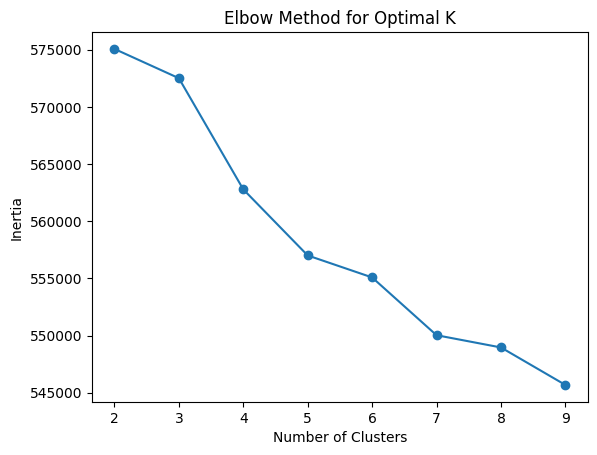

In [33]:
from sklearn.cluster import KMeans

# Use elbow method to find optimal k
inertia = []
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Plot elbow curve
import matplotlib.pyplot as plt
plt.plot(range(2, 10), inertia, marker='o')
plt.title("Elbow Method for Optimal K")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.show()

- The most noticeable elbow appears around K = 4.
- After K = 4, the drop in inertia becomes less steep.

In [34]:
optimal_k = 4
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
df_cluster_input['cluster'] = kmeans.fit_predict(X_scaled)

In [35]:
df_cluster_input

,patient_id,procedure_code_y_1011,procedure_code_y_1101,procedure_code_y_1102,procedure_code_y_1103,procedure_code_y_1104,procedure_code_y_1105,procedure_code_y_1110,procedure_code_y_1120,procedure_code_y_1130,...,SVD_92,SVD_93,SVD_94,SVD_95,SVD_96,SVD_97,SVD_98,SVD_99,SVD_100,cluster
0,4,0,0,0,0,0,0,0,0,0,...,0.351423,-0.155019,0.464609,0.558380,-0.400639,-0.524312,0.867817,0.507852,0.004563,3
1,9,0,0,0,1,0,0,0,0,0,...,-0.658138,-0.159248,1.639991,-0.622139,-0.557110,0.394722,0.456202,0.452231,0.023022,1
2,10,0,0,0,1,0,0,0,0,0,...,-1.478751,-0.622829,-0.378982,0.232787,0.240208,0.195519,-0.442379,0.114568,-0.363902,1
3,15,0,0,0,0,0,0,0,0,0,...,0.110029,-0.136961,-0.858896,0.160985,0.196457,-0.995509,0.022908,-0.359942,-0.394029,3
4,16,0,0,0,0,0,0,0,0,0,...,0.733900,-0.030795,0.412789,0.141118,-0.720074,1.322739,0.612670,0.162326,0.179971,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1672,12635,0,0,0,1,0,0,0,0,0,...,0.488130,-0.290675,0.389688,0.174579,0.146308,-0.393173,-0.399056,-0.152401,0.004060,1
1673,12692,0,0,0,0,0,0,0,0,0,...,-0.255470,-0.073209,0.152601,0.467458,0.066793,0.526277,-0.182349,-0.405991,0.325047,3
1674,12767,0,0,0,0,0,0,0,0,0,...,-0.084391,0.706285,-0.292752,-0.144202,-0.039473,0.057352,0.394792,0.045460,0.198033,1
1675,12812,0,0,0,1,0,0,0,0,0,...,0.275387,0.311430,-0.381809,0.135476,0.146322,0.048535,-0.413957,0.077467,0.724220,3


C:\Users\frank\AppData\Local\Temp\ipykernel_45664\3604915599.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Cluster")


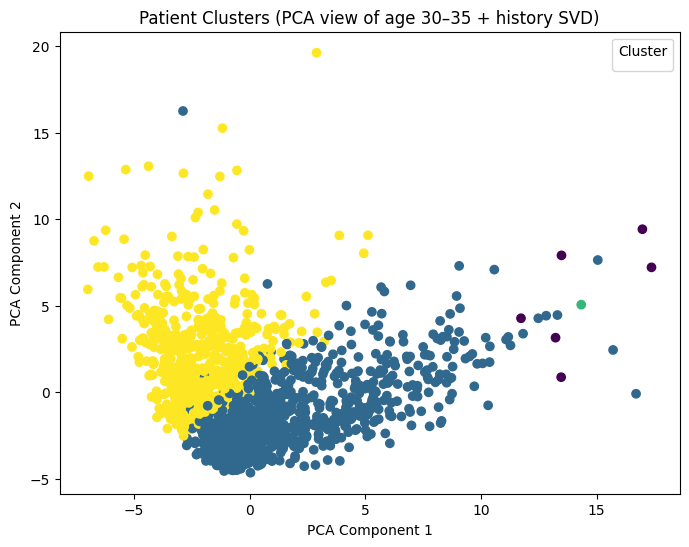

In [36]:
pca = PCA(n_components=2)
X_vis = pca.fit_transform(X_scaled)

plt.figure(figsize=(8, 6))
plt.scatter(X_vis[:, 0], X_vis[:, 1], c=df_cluster_input['cluster'], cmap='viridis')
plt.title("Patient Clusters (PCA view of age 30–35 + history SVD)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster")
plt.show()

Discussion:  
-   Clustering patients based on:  
    - Their treatment behavior at age 30–35 (df_30_35 one-hot columns)
    - Their broader treatment pattern from SVD (possibly all ages)

-   Clustering hybrid:
    - Current patterns (age 30–35 treatments)
    - Historical Overall context (via SVD)
    - A patient may look similar to another in age 30–35 treatments, but very different in long-term patterns. Clustering based on both helps avoid oversimplified groupings.

# Statistical insights on cluster 3 Kmeans and cluster 1 Kmeans

### Trajectory conduction and procedure distribution

Idea
- Pick a cluster (e.g., cluster 3 or 1 from  KMeans results of the 30_35 example)
- For each patient in this cluster, track their treatment procedures chronologically over time (from age 30 up to age 80)
- Build timelines or statistical summaries based on their procedural journeys

In [74]:
# All potential patients in cluster 3
patients_in_cluster_1 = df_cluster_input[df_cluster_input['cluster'] == 1]['patient_id']
patients_in_cluster_3 = df_cluster_input[df_cluster_input['cluster'] == 3]['patient_id']

In [75]:
# Get full timeline for these patients
df_cluster_timeline_1 = df_v1_v3[df_v1_v3['patient_id'].isin(patients_in_cluster_1)]
df_cluster_timeline_3= df_v1_v3[df_v1_v3['patient_id'].isin(patients_in_cluster_3)]

df_cluster_timeline_1 = df_cluster_timeline_1.sort_values(by=['patient_id', 'procedure_date'])
df_cluster_timeline_3 = df_cluster_timeline_3.sort_values(by=['patient_id', 'procedure_date'])

In [ ]:
df_cluster_timeline_1 # 55098  records are related to these patients from group 30-35 in cluster 1

,provider_x,amount,treatment_plan_status,procedure_date,patient_id,birth_date,city,state_y,first_visit,last_visit,...,treatment_category_14,treatment_category_15,treatment_category_16,treatment_category_17,treatment_category_18,treatment_category_19,treatment_category_20,treatment_category_21,version,age_group
45850,2,0.0,0,1993-04-19,9,1959-04-01,0,0,1993-04-19,2020-12-16,...,False,False,False,False,False,False,False,False,V3,30-35
45851,2,0.0,0,1993-04-19,9,1959-04-01,0,0,1993-04-19,2020-12-16,...,False,False,False,False,False,False,False,False,V3,30-35
45814,7,0.0,0,1994-01-10,9,1959-04-01,0,0,1993-04-19,2020-12-16,...,False,False,False,False,False,False,False,False,V3,30-35
45844,7,0.0,0,1994-01-10,9,1959-04-01,0,0,1993-04-19,2020-12-16,...,False,False,False,False,False,False,False,False,V3,30-35
45845,7,0.0,0,1994-01-10,9,1959-04-01,0,0,1993-04-19,2020-12-16,...,False,False,False,False,False,False,False,False,V3,30-35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
290776,21,197.0,0,2024-10-28,12820,1994-10-11,15,0,2021-06-29,2024-10-28,...,False,False,False,False,False,False,False,False,V1,30-35
290777,10,200.0,0,2024-10-28,12820,1994-10-11,15,0,2021-06-29,2024-10-28,...,False,False,False,False,False,False,False,False,V1,30-35
290806,10,200.0,0,2024-10-28,12820,1994-10-11,15,0,2021-06-29,2024-10-28,...,False,False,False,False,False,False,False,False,V1,30-35
290809,10,200.0,0,2024-10-28,12820,1994-10-11,15,0,2021-06-29,2024-10-28,...,False,False,False,False,False,False,False,False,V1,30-35


In [ ]:
df_cluster_timeline_3 # 47658 records are related to these patients from group 30-35 in cluster 3

,provider_x,amount,treatment_plan_status,procedure_date,patient_id,birth_date,city,state_y,first_visit,last_visit,...,treatment_category_14,treatment_category_15,treatment_category_16,treatment_category_17,treatment_category_18,treatment_category_19,treatment_category_20,treatment_category_21,version,age_group
121589,7,55.49,0,1990-08-02,4,1975-05-24,0,0,1990-01-30,2024-01-03,...,False,False,False,False,False,False,False,False,V3,15-20
127425,8,85.35,0,1991-08-12,4,1975-05-24,0,0,1990-01-30,2024-01-03,...,False,False,False,False,False,False,False,False,V3,15-20
127430,8,16.85,0,1991-08-12,4,1975-05-24,0,0,1990-01-30,2024-01-03,...,False,False,False,False,False,False,False,False,V3,15-20
127787,3,17.09,0,1994-11-05,4,1975-05-24,0,0,1990-01-30,2024-01-03,...,False,False,False,False,False,False,False,False,V3,15-20
127937,3,85.44,0,1994-11-05,4,1975-05-24,0,0,1990-01-30,2024-01-03,...,False,False,False,False,False,False,False,False,V3,15-20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126102,2,33.00,2,2024-11-11,12812,1990-06-28,0,0,2021-07-08,2024-11-11,...,False,False,False,False,False,False,False,False,V1,30-35
126104,2,197.00,2,2024-11-11,12812,1990-06-28,0,0,2021-07-08,2024-11-11,...,False,False,False,False,False,False,False,False,V1,30-35
126113,2,33.00,0,2024-11-11,12812,1990-06-28,0,0,2021-07-08,2024-11-11,...,False,False,False,False,False,False,False,False,V1,30-35
126124,2,36.00,0,2024-11-11,12812,1990-06-28,0,0,2021-07-08,2024-11-11,...,False,False,False,False,False,False,False,False,V1,30-35


In [78]:
df_cluster_timeline_1['patient_id'].unique()

array([    9,    10,    17,    24,    32,    39,    51,    57,    58,
          68,    72,    81,   115,   120,   138,   139,   147,   149,
         150,   152,   168,   176,   199,   214,   224,   248,   249,
         250,   252,   254,   265,   270,   271,   272,   273,   291,
         302,   303,   313,   323,   338,   352,   373,   378,   398,
         403,   413,   414,   421,   422,   423,   435,   436,   438,
         443,   448,   454,   473,   474,   482,   487,   490,   526,
         527,   531,   532,   538,   559,   579,   581,   582,   583,
         584,   585,   593,   606,   620,   630,   632,   638,   641,
         656,   677,   686,   687,   691,   703,   706,   709,   711,
         733,   735,   741,   744,   748,   753,   754,   755,   771,
         775,   776,   777,   780,   787,   788,   791,   793,   796,
         805,   811,   819,   825,   845,   853,   877,   878,   888,
         913,   915,   916,   924,   925,   941,   942,   944,   945,
         977,   983,

In [79]:
df_cluster_timeline_3['patient_id'].unique()

array([    4,    15,    16,    18,    19,    80,    91,    92,   118,
         119,   124,   173,   201,   206,   281,   292,   293,   311,
         312,   346,   347,   364,   365,   380,   397,   450,   457,
         478,   484,   508,   537,   568,   616,   619,   640,   654,
         668,   683,   685,   690,   697,   705,   710,   732,   745,
         746,   767,   781,   827,   861,   887,   914,   957,   991,
         992,   999,  1016,  1081,  1088,  1091,  1151,  1168,  1179,
        1180,  1184,  1196,  1197,  1210,  1251,  1261,  1301,  1312,
        1341,  1367,  1376,  1401,  1413,  1416,  1423,  1427,  1436,
        1443,  1451,  1459,  1575,  1586,  1589,  1591,  1609,  1610,
        1611,  1617,  1669,  1671,  1697,  1709,  1740,  1767,  1775,
        1783,  1797,  1817,  1832,  1836,  1837,  1844,  1869,  1895,
        1902,  1922,  1923,  1939,  1940,  1943,  1963,  1970,  1975,
        2005,  2038,  2066,  2102,  2115,  2123,  2136,  2150,  2151,
        2203,  2219,

In [ ]:
# Construct Patient Trajectories
from collections import defaultdict

# Identify all one-hot procedure columns
procedure_cols = [col for col in df_cluster_timeline_1.columns if col.startswith('procedure_code_y_')]
patient_trajectories_1 = defaultdict(list)

for _, row in df_cluster_timeline_1.iterrows():
    # Get patient_id and age
    pid = row['patient_id']
    age = row['procedure_age']
    
    # Extract actual procedure codes (column suffixes where value is True)
    codes = [col.split('_')[-1] for col in procedure_cols if row[col]]
    for code in codes:
        patient_trajectories_1[pid].append((age, code))


##############################################################


# Identify all one-hot procedure columns
procedure_cols = [col for col in df_cluster_timeline_3.columns if col.startswith('procedure_code_y_')]
patient_trajectories_3 = defaultdict(list)

for _, row in df_cluster_timeline_3.iterrows():
    # Get patient_id and age
    pid = row['patient_id']
    age = row['procedure_age']
    
    # Extract actual procedure codes (column suffixes where value is True)
    codes = [col.split('_')[-1] for col in procedure_cols if row[col]]
    for code in codes:
        patient_trajectories_3[pid].append((age, code))

In [81]:
patient_trajectories_1[9]


[(34.07397260273972, '2142'),
 (34.07397260273972, '11303'),
 (34.8027397260274, '12101'),
 (34.8027397260274, '11103'),
 (34.8027397260274, '1103'),
 (35.30958904109589, '11303'),
 (35.964383561643835, '11303'),
 (36.49041095890411, '1203'),
 (36.49041095890411, '43413'),
 (38.56438356164384, '2144'),
 (38.56438356164384, '2601'),
 (39.12054794520548, '11114'),
 (42.652054794520545, '11113'),
 (43.917808219178085, '11114'),
 (44.50684931506849, '11113'),
 (44.50684931506849, '1202'),
 (44.50684931506849, '2144'),
 (44.52876712328767, '23322'),
 (44.52876712328767, '23321'),
 (44.99178082191781, '11114'),
 (44.99178082191781, '11101'),
 (46.136986301369866, '2114'),
 (46.657534246575345, '11107'),
 (47.21643835616438, '11112'),
 (47.21643835616438, '1204'),
 (47.964383561643835, '16511'),
 (48.961643835616435, '23112'),
 (48.961643835616435, '1205'),
 (50.18904109589041, '23111'),
 (57.93972602739726, '11107'),
 (57.93972602739726, '11113'),
 (58.43561643835616, '11113'),
 (58.43561643

In [82]:
patient_trajectories_3[4]

[(15.202739726027398, '23321'),
 (16.23013698630137, '11303'),
 (16.23013698630137, '2142'),
 (19.465753424657535, '12101'),
 (19.465753424657535, '1103'),
 (19.465753424657535, '2601'),
 (19.465753424657535, '2144'),
 (19.465753424657535, '11103'),
 (20.493150684931507, '2142'),
 (20.493150684931507, '43412'),
 (20.493150684931507, '12101'),
 (20.493150684931507, '1204'),
 (20.624657534246577, '2112'),
 (20.624657534246577, '1205'),
 (20.649315068493152, '72211'),
 (21.495890410958904, '11112'),
 (21.495890410958904, '11117'),
 (22.01095890410959, '11113'),
 (22.526027397260275, '2144'),
 (23.03835616438356, '11112'),
 (23.03835616438356, '11117'),
 (24.041095890410958, '11113'),
 (25.304109589041097, '12101'),
 (25.304109589041097, '11113'),
 (25.304109589041097, '1204'),
 (25.304109589041097, '2144'),
 (25.649315068493152, '2111'),
 (25.693150684931506, '71201'),
 (26.35890410958904, '11111'),
 (26.915068493150685, '11107'),
 (27.96986301369863, '11107'),
 (28.484931506849314, '1111

In [83]:
# Flatten the trajectory into a DataFrame
records_1 = []

for pid, traj in patient_trajectories_1.items():
    for age, code in traj:
        age_bin = (int(age) // 5) * 5  # e.g., 32 -> 30, 47 -> 45
        records_1.append((pid, age, age_bin, code))

df_proc_timeline_1= pd.DataFrame(records_1, columns=['patient_id', 'age', 'age_bin', 'procedure_code'])

# Count top procedures per age_bin
top_procs_by_bin = df_proc_timeline_1.groupby(['age_bin', 'procedure_code']).size().reset_index(name='count')
# Get top 15 per bin
top15 = top_procs_by_bin.groupby('age_bin').apply(lambda g: g.sort_values(by='count', ascending=False).head(15)).reset_index(drop=True)


##################################################

# Flatten the trajectory into a DataFrame
records_3 = []

for pid, traj in patient_trajectories_3.items():
    for age, code in traj:
        age_bin = (int(age) // 5) * 5  # e.g., 32 -> 30, 47 -> 45
        records_3.append((pid, age, age_bin, code))

df_proc_timeline_3= pd.DataFrame(records_3, columns=['patient_id', 'age', 'age_bin', 'procedure_code'])

# Count top procedures per age_bin
top_procs_by_bin = df_proc_timeline_3.groupby(['age_bin', 'procedure_code']).size().reset_index(name='count')
# Get top 15 per bin
top15 = top_procs_by_bin.groupby('age_bin').apply(lambda g: g.sort_values(by='count', ascending=False).head(15)).reset_index(drop=True)

C:\Users\frank\AppData\Local\Temp\ipykernel_45664\3790724454.py:14: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top15 = top_procs_by_bin.groupby('age_bin').apply(lambda g: g.sort_values(by='count', ascending=False).head(15)).reset_index(drop=True)
C:\Users\frank\AppData\Local\Temp\ipykernel_45664\3790724454.py:32: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top15 = top_procs_by_bin.groupby('age_bin').ap

C:\Users\frank\AppData\Local\Temp\ipykernel_45664\1111589916.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_code['age'] = df_code['age'].astype(int)


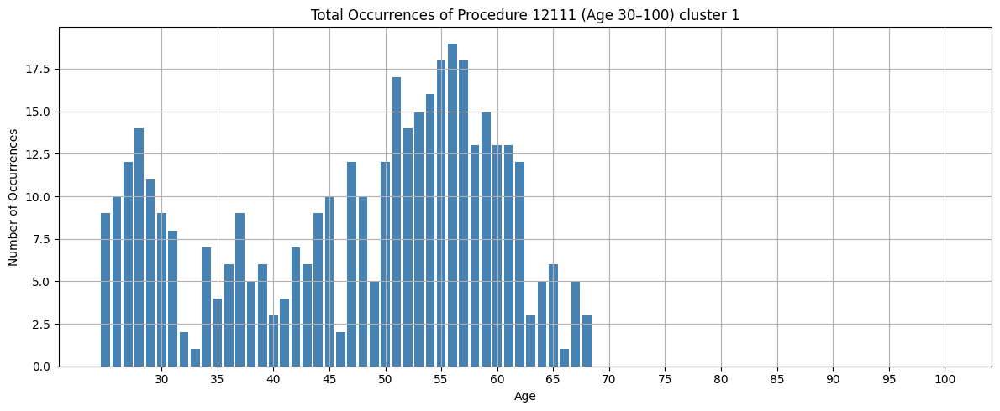

In [84]:
target_code = '12111'
df_code = df_proc_timeline_1[df_proc_timeline_1['procedure_code'] == target_code]

# Round ages if needed
df_code['age'] = df_code['age'].astype(int)

# Count how many times it occurred at each age
age_distribution = df_code['age'].value_counts().sort_index()
full_range = pd.Series(index=range(30, 101), dtype=int)
# Fill missing (NaN) values before casting to int
age_distribution = full_range.add(age_distribution, fill_value=0).fillna(0).astype(int)

plt.figure(figsize=(12, 5))
plt.bar(age_distribution.index, age_distribution.values, color='steelblue')
plt.title(f"Total Occurrences of Procedure {target_code} (Age 30–100) cluster 1")
plt.xlabel("Age")
plt.ylabel("Number of Occurrences")
plt.grid(True)
plt.xticks(range(30, 101, 5))
plt.tight_layout()
plt.show()

C:\Users\frank\AppData\Local\Temp\ipykernel_45664\2939684629.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_code['age'] = df_code['age'].astype(int)


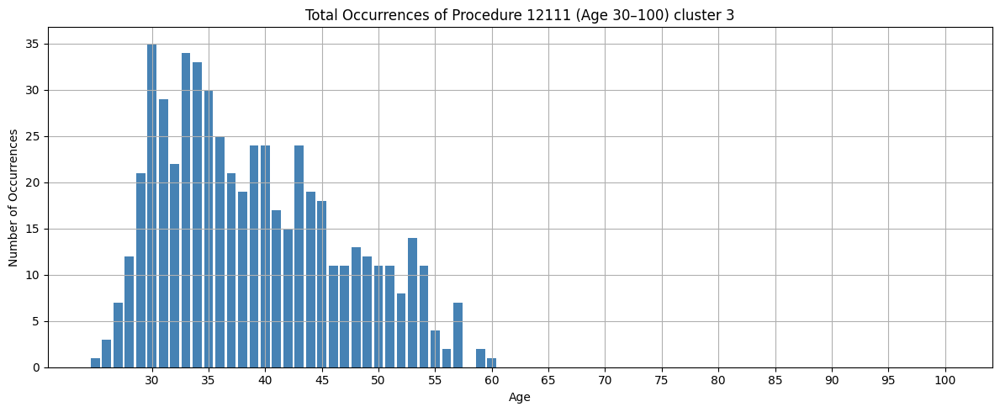

In [86]:
target_code = '12111'
df_code = df_proc_timeline_3[df_proc_timeline_3['procedure_code'] == target_code]

# Round ages if needed
df_code['age'] = df_code['age'].astype(int)

# Count how many times it occurred at each age
age_distribution = df_code['age'].value_counts().sort_index()
full_range = pd.Series(index=range(30, 101), dtype=int)
# Fill missing (NaN) values before casting to int
age_distribution = full_range.add(age_distribution, fill_value=0).fillna(0).astype(int)

plt.figure(figsize=(12, 5))
plt.bar(age_distribution.index, age_distribution.values, color='steelblue')
plt.title(f"Total Occurrences of Procedure {target_code} (Age 30–100) cluster 3")
plt.xlabel("Age")
plt.ylabel("Number of Occurrences")
plt.grid(True)
plt.xticks(range(30, 101, 5))
plt.tight_layout()
plt.show()

### Raw version of top 15 procedure code in cluster

In [92]:
# Count total frequency of each procedure code in the cluster 1
top_codes_1 = df_proc_timeline_1['procedure_code'].value_counts().head(15)
print("Top 15 Most Frequent Procedure Codes in Cluster 1:")
print(top_codes_1)

Top 15 Most Frequent Procedure Codes in Cluster 1:
procedure_code
11113    4639
12101    4195
1202     3036
1204     2912
11107    2612
2144     2521
11117    2515
2142     2342
11112    2325
11101    2082
11114    1872
2601     1831
2114     1414
1103     1136
23322    1079
Name: count, dtype: int64


In [93]:
# Count total frequency of each procedure code in the cluster 3
top_codes_3 = df_proc_timeline_3['procedure_code'].value_counts().head(15)
print("Top 15 Most Frequent Procedure Codes in Cluster 3:")
print(top_codes_3)

Top 15 Most Frequent Procedure Codes in Cluster 3:
procedure_code
11113    4615
12101    3683
1202     3309
11107    2923
11117    2458
1204     2296
11101    2274
11112    2249
2142     2102
2144     1844
2114     1562
2601     1431
11114    1233
23322    1065
23321    1062
Name: count, dtype: int64


In [94]:
# Mapping codes and their description
def get_procedure_description(input_code):
    """
    Given an Excel file path, sheet name, and a string like 'procedure_code_###',
    returns the description of the corresponding procedure code.
    """
    file_path = r"C:\Frank\UoT 2024-2025\MIE8888 Project\M22\Procedure_Description_Mapping.xlsx"
    df = pd.read_excel(file_path, sheet_name="Mapping Table")
    code_number = input_code.replace("procedure_code_y_", "")
    result = df.loc[df['CODE'].astype(str) == code_number, 'DESCRIPTION']
    if not result.empty:
        return result.values[0]
    else:
        return f"No description found for code: {input_code}"

In [ ]:
top_codes_df_1 = top_codes_1.reset_index()
top_codes_df_1.columns = ['procedure_code', 'count']
top_codes_df_1['description'] = top_codes_df_1['procedure_code'].apply(get_procedure_description)
top_codes_df_1


,procedure_code,count,description
0,11113,4639,Scaling - Three units (45 minutes)
1,12101,4195,No description found for code: 12101
2,1202,3036,"Examination and Diagnosis, Limited Oral, Previ..."
3,1204,2912,"Examination and Diagnosis, Specific - Examinat..."
4,11107,2612,Polishing - One half unit (7.5 minutes)
5,2144,2521,"Radiographs, Regional/Localized, Bitewing - Fo..."
6,11117,2515,Scaling - One half unit (7.5 minutes)
7,2142,2342,"Radiographs, Regional/Localized, Bitewing - Tw..."
8,11112,2325,Scaling - Two units (30 minutes)
9,11101,2082,Polishing - One unit of time (15 minutes)


In [97]:
top_codes_df_3 = top_codes_3.reset_index()
top_codes_df_3.columns = ['procedure_code', 'count']
top_codes_df_3['description'] = top_codes_df_3['procedure_code'].apply(get_procedure_description)
top_codes_df_3


,procedure_code,count,description
0,11113,4615,Scaling - Three units (45 minutes)
1,12101,3683,No description found for code: 12101
2,1202,3309,"Examination and Diagnosis, Limited Oral, Previ..."
3,11107,2923,Polishing - One half unit (7.5 minutes)
4,11117,2458,Scaling - One half unit (7.5 minutes)
5,1204,2296,"Examination and Diagnosis, Specific - Examinat..."
6,11101,2274,Polishing - One unit of time (15 minutes)
7,11112,2249,Scaling - Two units (30 minutes)
8,2142,2102,"Radiographs, Regional/Localized, Bitewing - Tw..."
9,2144,1844,"Radiographs, Regional/Localized, Bitewing - Fo..."


### Top 15 procedure code without basic codes in cluster

In [98]:
# Count all procedure codes
code_counts = df_proc_timeline_1['procedure_code'].value_counts()

# Define filter to exclude basic treatments
def is_non_basic(code):
    return not (code.startswith('1') or len(code) == 4)

# Filter and take top 15
filtered_counts = code_counts[code_counts.index.map(is_non_basic)].head(15)

# Convert to DataFrame and add descriptions
top_codes_df_1_pro = filtered_counts.reset_index()
top_codes_df_1_pro.columns = ['procedure_code', 'count']
top_codes_df_1_pro['description'] = top_codes_df_1_pro['procedure_code'].apply(get_procedure_description)
top_codes_df_1_pro


,procedure_code,count,description
0,23322,1079,No description found for code: 23322
1,23321,971,No description found for code: 23321
2,99111,856,+L Commercial Laboratory Procedures (A commerc...
3,23323,767,No description found for code: 23323
4,43413,571,No description found for code: 43413
5,23324,499,No description found for code: 23324
6,43412,497,No description found for code: 43412
7,23312,456,No description found for code: 23312
8,27211,435,"Crown, Porcelain/Ceramic/Polymer Glass Fused t..."
9,43414,351,No description found for code: 43414


In [99]:
# Count all procedure codes
code_counts = df_proc_timeline_3['procedure_code'].value_counts()

# Define filter to exclude basic treatments
def is_non_basic(code):
    return not (code.startswith('1') or len(code) == 4)

# Filter and take top 15
filtered_counts = code_counts[code_counts.index.map(is_non_basic)].head(15)

# Convert to DataFrame and add descriptions
top_codes_df_3_pro = filtered_counts.reset_index()
top_codes_df_3_pro.columns = ['procedure_code', 'count']
top_codes_df_3_pro['description'] = top_codes_df_3_pro['procedure_code'].apply(get_procedure_description)
top_codes_df_3_pro


,procedure_code,count,description
0,23322,1065,No description found for code: 23322
1,23321,1062,No description found for code: 23321
2,23323,675,No description found for code: 23323
3,99111,674,+L Commercial Laboratory Procedures (A commerc...
4,23312,438,No description found for code: 23312
5,23324,382,No description found for code: 23324
6,23111,329,No description found for code: 23111
7,23311,326,No description found for code: 23311
8,23313,303,No description found for code: 23313
9,27211,236,"Crown, Porcelain/Ceramic/Polymer Glass Fused t..."


###  Non Basic Heatmap

C:\Users\frank\AppData\Local\Temp\ipykernel_45664\779993581.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top15 = top_procs_by_bin.groupby('age_bin').apply(lambda g: g.sort_values(by='count', ascending=False).head(15)).reset_index(drop=True)


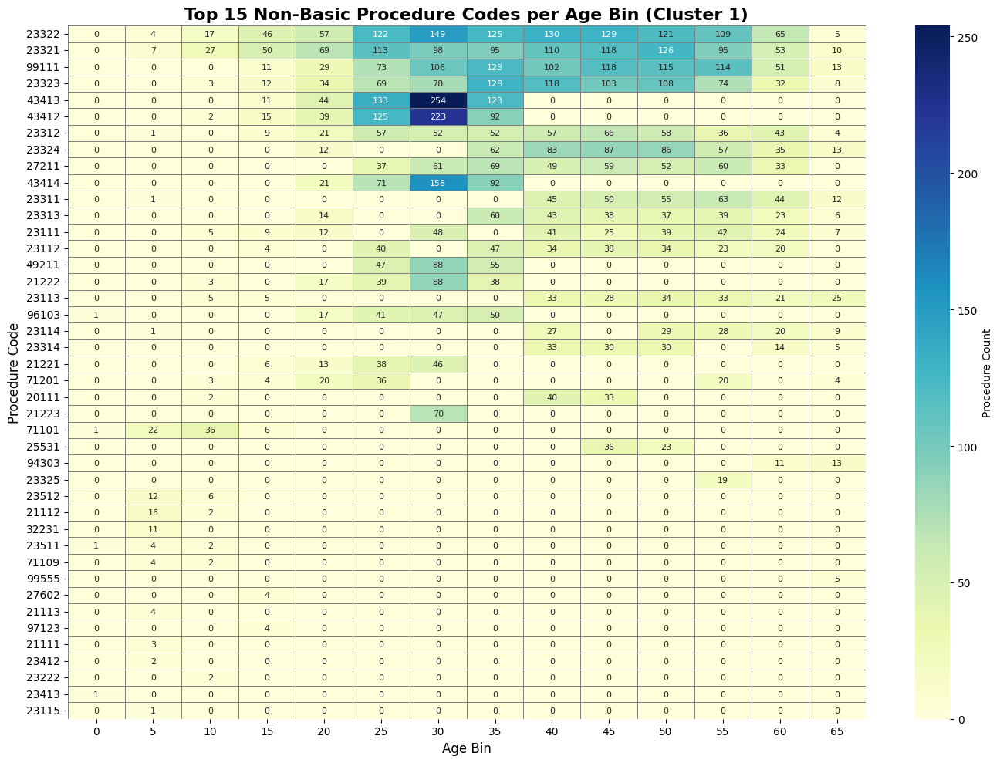

In [107]:
# Count procedures per age_bin
top_procs_by_bin = df_proc_timeline_1.groupby(['age_bin', 'procedure_code']).size().reset_index(name='count')
# Apply non-basic treatment filter
top_procs_by_bin = top_procs_by_bin[top_procs_by_bin['procedure_code'].apply(is_non_basic)]

# Get top 30 procedures per age_bin
top15 = top_procs_by_bin.groupby('age_bin').apply(lambda g: g.sort_values(by='count', ascending=False).head(15)).reset_index(drop=True)

# Pivot for heatmap
heatmap_data = top15.pivot_table(
    index='procedure_code',
    columns='age_bin',
    values='count',
    fill_value=0
)

# Sort procedures by total frequency
sorted_index = heatmap_data.sum(axis=1).sort_values(ascending=False).index
heatmap_data = heatmap_data.loc[sorted_index]

# heatmap
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 10))
sns.heatmap(
    heatmap_data,
    cmap='YlGnBu',
    annot=True,
    fmt='.0f',
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={'label': 'Procedure Count'},
    annot_kws={'size': 8}
)

# Step 6: Add labels and polish
plt.title("Top 15 Non-Basic Procedure Codes per Age Bin (Cluster 1)", fontsize=16, fontweight='bold')
plt.xlabel("Age Bin", fontsize=12)
plt.ylabel("Procedure Code", fontsize=12)
plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

C:\Users\frank\AppData\Local\Temp\ipykernel_45664\401979564.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top15 = top_procs_by_bin.groupby('age_bin').apply(lambda g: g.sort_values(by='count', ascending=False).head(15)).reset_index(drop=True)


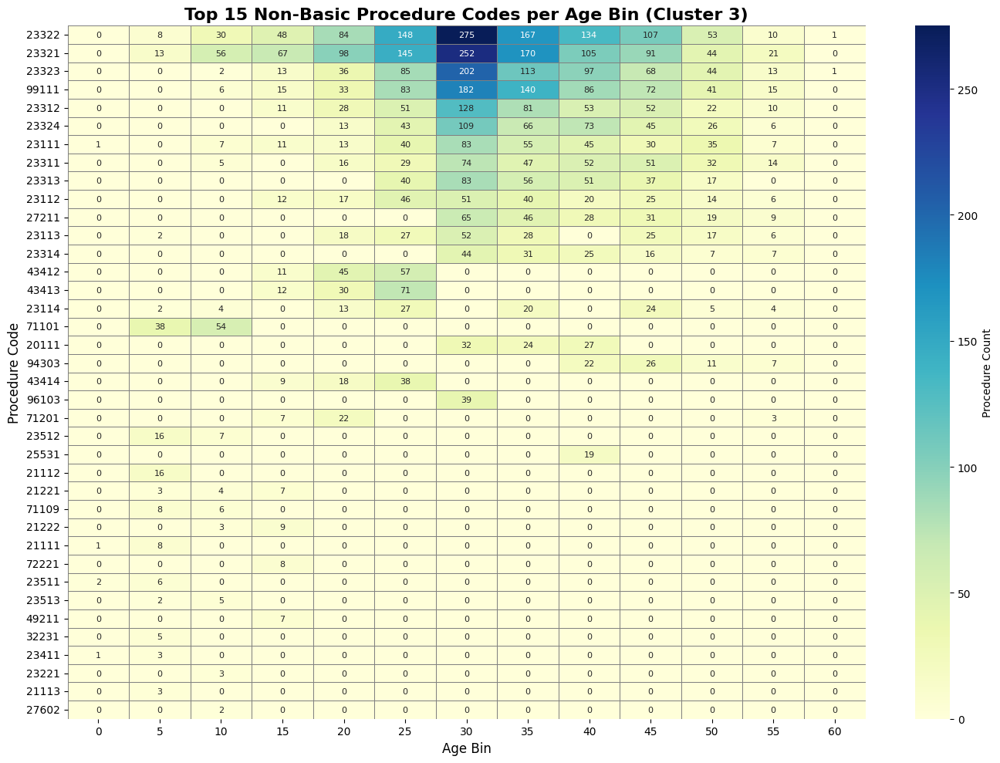

In [109]:
# Count procedures per age_bin
top_procs_by_bin = df_proc_timeline_3.groupby(['age_bin', 'procedure_code']).size().reset_index(name='count')
# Apply non-basic treatment filter
top_procs_by_bin = top_procs_by_bin[top_procs_by_bin['procedure_code'].apply(is_non_basic)]

# Get top 30 procedures per age_bin
top15 = top_procs_by_bin.groupby('age_bin').apply(lambda g: g.sort_values(by='count', ascending=False).head(15)).reset_index(drop=True)

# Pivot for heatmap
heatmap_data = top15.pivot_table(
    index='procedure_code',
    columns='age_bin',
    values='count',
    fill_value=0
)

# Sort procedures by total frequency
sorted_index = heatmap_data.sum(axis=1).sort_values(ascending=False).index
heatmap_data = heatmap_data.loc[sorted_index]

# heatmap
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 10))
sns.heatmap(
    heatmap_data,
    cmap='YlGnBu',
    annot=True,
    fmt='.0f',
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={'label': 'Procedure Count'},
    annot_kws={'size': 8}
)

# Step 6: Add labels and polish
plt.title("Top 15 Non-Basic Procedure Codes per Age Bin (Cluster 3)", fontsize=16, fontweight='bold')
plt.xlabel("Age Bin", fontsize=12)
plt.ylabel("Procedure Code", fontsize=12)
plt.xticks(rotation=0, fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()